<a href="https://colab.research.google.com/github/cutemfc/Automating-Classification-Flowers-/blob/main/Automating_Flower_classificaton_background_uniformation_final_fix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project: Information Technology. Automating Flower Classification for a Start-up Using Deep Learning(cont's)
## We held two methods to  improve the model
(1) Apply Gaussain blur and flipes of the pictures
| Method                                      | Training Coarse Acc. | Training Fine Acc. | Validation Coarse Acc. | Validation Fine Acc. |
| ------------------------------------------- | -------------------- | ------------------ | ---------------------- | -------------------- |
| **Gaussian blur + Hierarchical clustering** | 0.4344               | 0.1412             | 0.2176                 | 0.0294               |
| **Resize only + Hierarchical clustering**   | 0.5258               | 0.3506             | 0.3333                 | 0.1196               |
| **Original model (no clustering)**          | –                    | 0.0085             | –                      | 0.0098               |
| **U²-Net + mean/std preprocessing**         | –                    | 0.1576             | –                      | 0.0873               |

           
(1) Gaussianblur + Hierachical clustering and Hierachical clustering only

- Hierarchical clustering provides ~10× improvement in fine accuracy compared to the original model.

- Resizing only + clustering achieves the best overall results.

- Gaussian blur degrades performance, likely due to the loss of fine-grained floral features needed for classification.

(2) Using Pytorch and OpenCv to do segmentation and turn to Tensorflow (apply U2-Net)
- U²-Net with mean/std normalization improves fine-grained classification performance compared to the original model, despite not using clustering.
- Training fine accuracy reaches 0.1576, and validation fine accuracy improves to 0.0873, indicating that statistical normalization helps the model better generalize to unseen data.
- While not outperforming clustering-based methods, this preprocessing strategy enhances feature consistency, likely aiding segmentation and classification of subtle floral patterns.
- The results suggest that U²-Net’s segmentation capabilities combined with normalization offer a meaningful boost, especially when clustering is not applied.


# Step 1 Apply Gaussian blur and flips of the picture


In [ ]:
# load the necessary packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
import tensorflow as tf





#(1) Load the data

In [ ]:
# Load dataset
dataset, info = tfds.load('oxford_flowers102', with_info=True, as_supervised=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/incomplete.JUNOCD_2.1.1/oxford_flowers102-train.tfrecord…

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/incomplete.JUNOCD_2.1.1/oxford_flowers102-test.tfrecord*…

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/incomplete.JUNOCD_2.1.1/oxford_flowers102-validation.tfr…

Dataset oxford_flowers102 downloaded and prepared to /root/tensorflow_datasets/oxford_flowers102/2.1.1. Subsequent calls will reuse this data.


In [ ]:
# Define the dataset
training_set=dataset['test']
test_set=dataset['train']
validation_set=dataset['validation']

#(2)Preprocessing of training data

In [ ]:
# Image size
image_size=224
batch_size=32
def gaussian_kernel(size:int, sigma:float):
    x=tf.range(-size//2+1, size//2+1, dtype=tf.float32)
    x=tf.math.exp(-0.5*(x/sigma)**2)
    kernel1d=x/tf.reduce_sum(x)
    kernel2d=tf.tensordot(kernel1d, kernel1d, axes=0)
    kernel2d=kernel2d/tf.reduce_sum(kernel2d)
    return kernel2d

def apply_gaussian_blur(image, kernel_size, sigma=1.0):
    kernel=gaussian_kernel(kernel_size, sigma)
    kernel=kernel[:,:, tf.newaxis, tf.newaxis]
    kernel=tf.tile(kernel,[1,1,3,1])
    image=tf.expand_dims(image,axis=0)
    image=tf.nn.depthwise_conv2d(image, kernel, strides=[1,1,1,1], padding='SAME')

    return tf.squeeze(image, axis=0)

def augment_with_blurred_background(image, label):
    image=tf.image.resize(image,(image_size,image_size))/255.0
    blurred=apply_gaussian_blur(image, kernel_size=7, sigma=1.5)# include the gaussian blur to the background
    alpha=tf.random.uniform([],0.3, 0.5) # the value higher, more blurred of the background
    image=(1-alpha)*image + alpha*blurred


    image=tf.image.random_flip_left_right(image)
    image=tf.image.random_flip_up_down(image)
    image=tf.image.random_brightness(image, max_delta=0.2)

    return image,label
def format_image(image, label): # for the validation and test without augmentation
    image=tf.image.resize(image, (image_size, image_size))/255.0
    return image,label
# count numbers
num_training_examples=0
num_validation_examples=0
num_test_examples=0
for  example in training_set:
    num_training_examples+=1
for example in validation_set:
    num_validation_examples+=1
for example in test_set:
        num_test_examples+=1

# train/val/test pipeline
train_batches=training_set.cache().shuffle(max(1024,num_training_examples))
train_batches=train_batches.map(augment_with_blurred_background,num_parallel_calls=tf.data.AUTOTUNE).batch(batch_size).prefetch(tf.data.AUTOTUNE)# .cache the data is saved on the ram, prefetc : prepare the trainging data and training simultaneously

val_batches=validation_set.map(format_image, num_parallel_calls=tf.data.AUTOTUNE).batch(batch_size).prefetch(tf.data.AUTOTUNE)

test_batches=test_set.map(format_image, num_parallel_calls=tf.data.AUTOTUNE).batch(batch_size).prefetch(tf.data.AUTOTUNE)


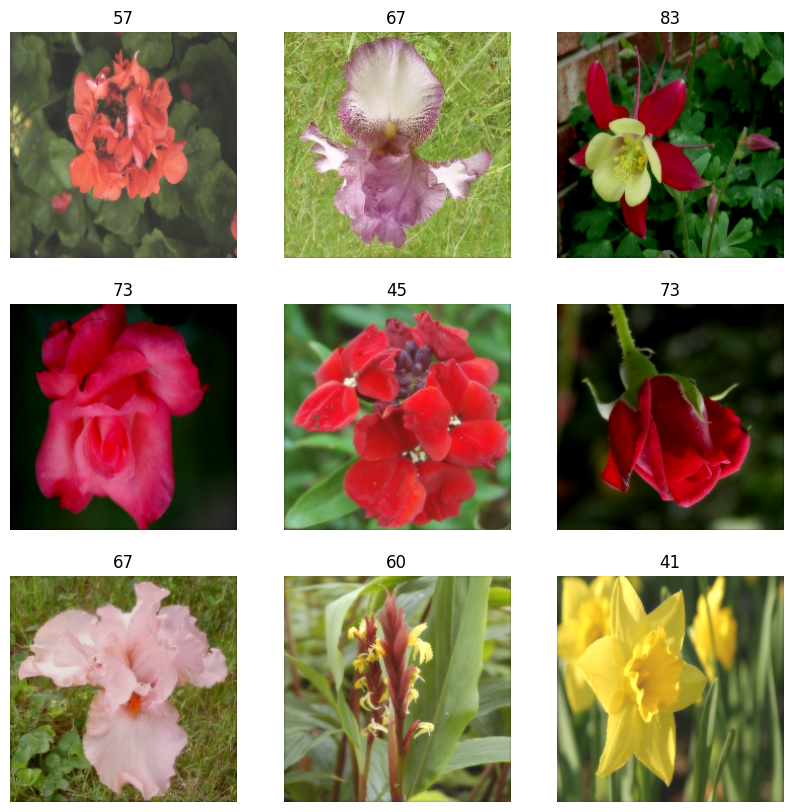

In [ ]:
for images, labels in train_batches.take(1):
    plt.figure(figsize=(10,10))
    for i in range(min(9, images.shape[0])): # Adjust loop range to display up to 9 images
        ax = plt.subplot(3,3,i+1)  # Change grid size to 3x3 to accommodate more plots
        plt.imshow(images[i].numpy())   # 這裡一定要 .numpy()
        plt.title(int(labels[i].numpy()))
        plt.axis("off")
    plt.show()

#(3) Apply to Hierachical clustering

In [ ]:
# Apply to the archiachical model, import esstential pacjages
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from collections import defaultdict
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from sklearn.cluster import AgglomerativeClustering
import os



## Create the ResNet 50 embedding model


In [ ]:
# create the ResNet50 Embedding model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3),pooling='avg')
base_model.trainable = False

In [ ]:
# Get Embedding
num_classes = 102
feat_dim = 2048

class_sums = np.zeros([num_classes, feat_dim], dtype=np.float32)
class_counts = np.zeros([num_classes], dtype=np.int32)

for imgs, lbls in train_batches:
    feats = base_model(imgs, training=False).numpy()   # (batch, 2048)
    lbls = lbls.numpy().astype(np.int32)

    # batches accumulation
    np.add.at(class_sums, lbls, feats)
    np.add.at(class_counts, lbls, 1)

class_embeddings = class_sums / np.expand_dims(class_counts, -1)
print(class_embeddings.shape)  # (102, 2048)


(102, 2048)


In [ ]:
# Save the class_embeddings
from google.colab import drive
drive.mount('/content/drive')
np.save('/content/drive/MyDrive/Automating Flower Classification/class_embeddings_backgroundblur.npy', class_embeddings)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Load class_emnedding.numpy()
from google.colab import drive
drive.mount('/content/drive')
import numpy as np
class_embeddings=np.load('/content/drive/MyDrive/Automating Flower Classification/class_embeddings_backgroundblur.npy')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Get 10 coarse of super class by Hierarcical clustering

In [ ]:
# Get 10 coarse of super class by Hierarchical clustering
k=10
agglo=AgglomerativeClustering(n_clusters=k, linkage='ward') # Removed affinity='euclidean'
cluster_ids=agglo.fit_predict(class_embeddings) # Used class_embeddings and converted to NumPy

# Output the cluster
for i, cluster in enumerate(cluster_ids):
    print(f"Class {i} → Group {cluster}")

Class 0 → Group 7
Class 1 → Group 1
Class 2 → Group 9
Class 3 → Group 4
Class 4 → Group 6
Class 5 → Group 4
Class 6 → Group 3
Class 7 → Group 4
Class 8 → Group 5
Class 9 → Group 2
Class 10 → Group 9
Class 11 → Group 7
Class 12 → Group 4
Class 13 → Group 7
Class 14 → Group 1
Class 15 → Group 6
Class 16 → Group 3
Class 17 → Group 3
Class 18 → Group 2
Class 19 → Group 1
Class 20 → Group 0
Class 21 → Group 4
Class 22 → Group 9
Class 23 → Group 4
Class 24 → Group 4
Class 25 → Group 6
Class 26 → Group 9
Class 27 → Group 4
Class 28 → Group 2
Class 29 → Group 5
Class 30 → Group 1
Class 31 → Group 5
Class 32 → Group 2
Class 33 → Group 7
Class 34 → Group 4
Class 35 → Group 8
Class 36 → Group 4
Class 37 → Group 4
Class 38 → Group 2
Class 39 → Group 9
Class 40 → Group 1
Class 41 → Group 7
Class 42 → Group 1
Class 43 → Group 2
Class 44 → Group 9
Class 45 → Group 7
Class 46 → Group 6
Class 47 → Group 6
Class 48 → Group 0
Class 49 → Group 1
Class 50 → Group 1
Class 51 → Group 1
Class 52 → Group 1
Cla

In [ ]:
# Redefine the image to coarse label and fine label
image_size=224
def format_image(image, label):
    image=tf.image.resize(image, (image_size, image_size))/255.0
    # define coarse label from fine label
    coarse_label=tf.gather(tf.constant(cluster_ids,dtype=tf.int64), label)
    return image,{"coarse":coarse_label,"fine":label}
# getting the number of example in each set from the dataset info
num_training_examples=0
num_validation_examples=0
num_test_examples=0

for  example in training_set:
    num_training_examples+=1
for example in validation_set:
    num_validation_examples+=1
for example in test_set:
        num_test_examples+=1

# setting up a batch size
Batch_size=32

# Preprocessing images for all 3 subsets
train_batches=training_set.cache().shuffle(num_training_examples//4)
train_batches=train_batches.map(format_image).batch(Batch_size).prefetch(1)

val_batches=validation_set.cache()
val_batches=val_batches.map(format_image).batch(Batch_size).prefetch(1)

test_batches=test_set.cache()
test_batches=test_batches.map(format_image).batch(Batch_size).prefetch(1)

In [ ]:
# Plot the Hierachical clustering of each name of class, not image
# import packages
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram

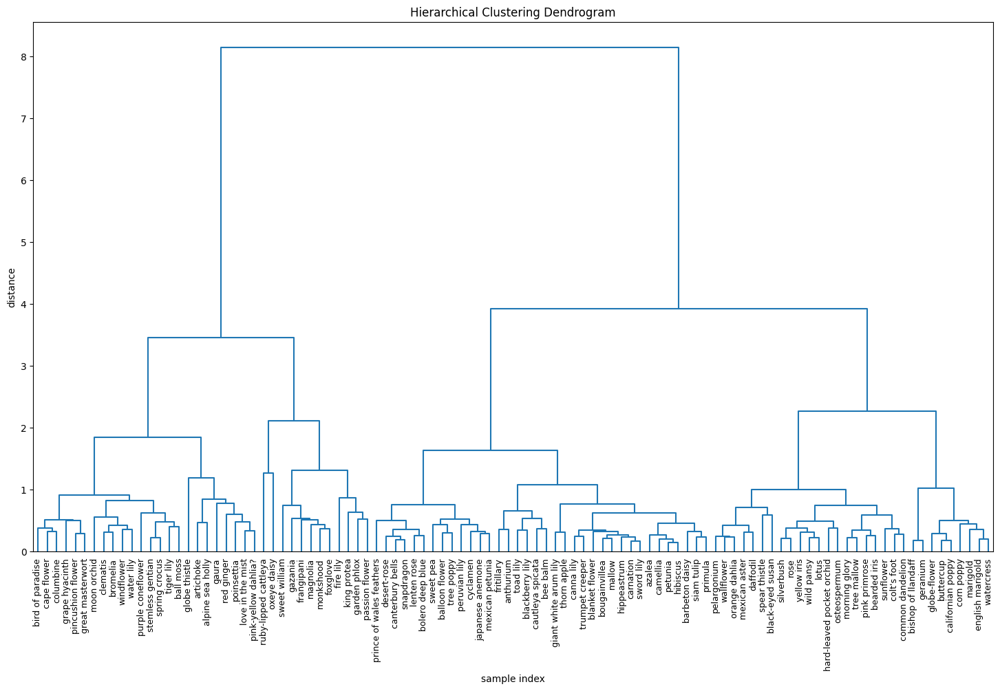

In [ ]:
embedding_np=class_embeddings
label_names=info.features['label'].names # Access label names from dataset info
names=label_names
linked=linkage(embedding_np, method='ward')
plt.figure(figsize=(18,10))
dendrogram(linked,labels=names, leaf_rotation=90,leaf_font_size=9,color_threshold=0)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
plt.show()

In [ ]:
# Define label_names
label_names=info.features['label'].names # Access label names from dataset info

Classes in Group 1:
hard-leaved pocket orchid
yellow iris
giant white arum lily
carnation
barbeton daisy
sword lily
common dandelion
petunia
wild pansy
primula
sunflower
silverbush
osteospermum
bearded iris
azalea
rose
thorn apple
morning glory
lotus
hibiscus
tree mallow
canna lily
hippeastrum
bougainvillea
camellia
mallow
blanket flower
trumpet creeper
blackberry lily


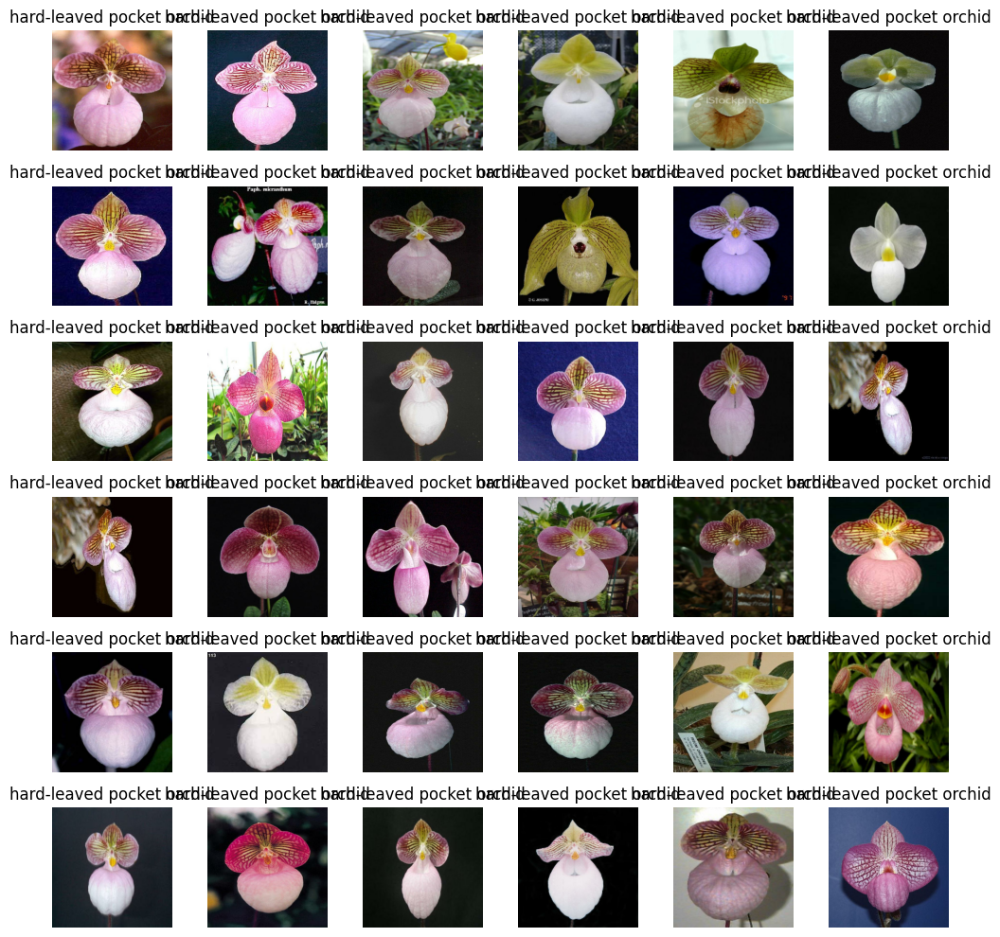

In [ ]:

# Plot the Group 1
target_group = 1

# Find all class belong to this index
group_indices = [i for i, cluster in enumerate(cluster_ids) if cluster == target_group]

#Change the class index to flowers' name
group_class_names = [label_names[i] for i in group_indices]

# Display the result
print(f"Classes in Group {target_group}:")
for name in group_class_names:
    print(name)

# Show the Image of Group 1, limiting to a maximum of 36 images
plt.figure(figsize=(10, 10))
images_to_plot = []
for class_name in group_class_names:
    for image, label in train_batches.unbatch():
        if label_names[label['fine'].numpy()] == class_name:
            images_to_plot.append((image.numpy(), class_name))
            if len(images_to_plot) >= 36:
                break
    if len(images_to_plot) >= 36:
        break

for i, (image, class_name) in enumerate(images_to_plot):
    ax = plt.subplot(6, 6, i + 1)
    plt.imshow(image)
    plt.title(class_name)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Plot the flowers name in group 1
def group_classes(target_group, cluster_ids, label_names, train_batches, max_classes=20):
    image_group_indices = [i for i, cluster in enumerate(cluster_ids) if cluster == target_group]
    group_class_names = [label_names[i] for i in image_group_indices]
    print(f"Classes in Group {target_group}:")

    for name in group_class_names:
        print(name)

    plt.figure(figsize=(12, 12))
    shown_classes = set()
    plot_index = 1


# find the plot of the class and save only one plot
    for image, label in train_batches.unbatch():
        class_id=int(label['fine'].numpy())
        class_name=label_names[class_id]
        if class_id in group_indices and class_name not in shown_classes:
            ax=plt.subplot(5, 5, plot_index)
            plt.imshow(image.numpy())
            plt.title(class_name, fontsize=8) # Corrected typo here
            plt.axis("off")
            shown_classes.add(class_name) # Changed append to add for set
            plot_index+=1
            if plot_index>25:
                break
    plt.tight_layout()
    plt.show()

Classes in Group 1:
hard-leaved pocket orchid
yellow iris
giant white arum lily
carnation
barbeton daisy
sword lily
common dandelion
petunia
wild pansy
primula
sunflower
silverbush
osteospermum
bearded iris
azalea
rose
thorn apple
morning glory
lotus
hibiscus
tree mallow
canna lily
hippeastrum
bougainvillea
camellia
mallow
blanket flower
trumpet creeper
blackberry lily


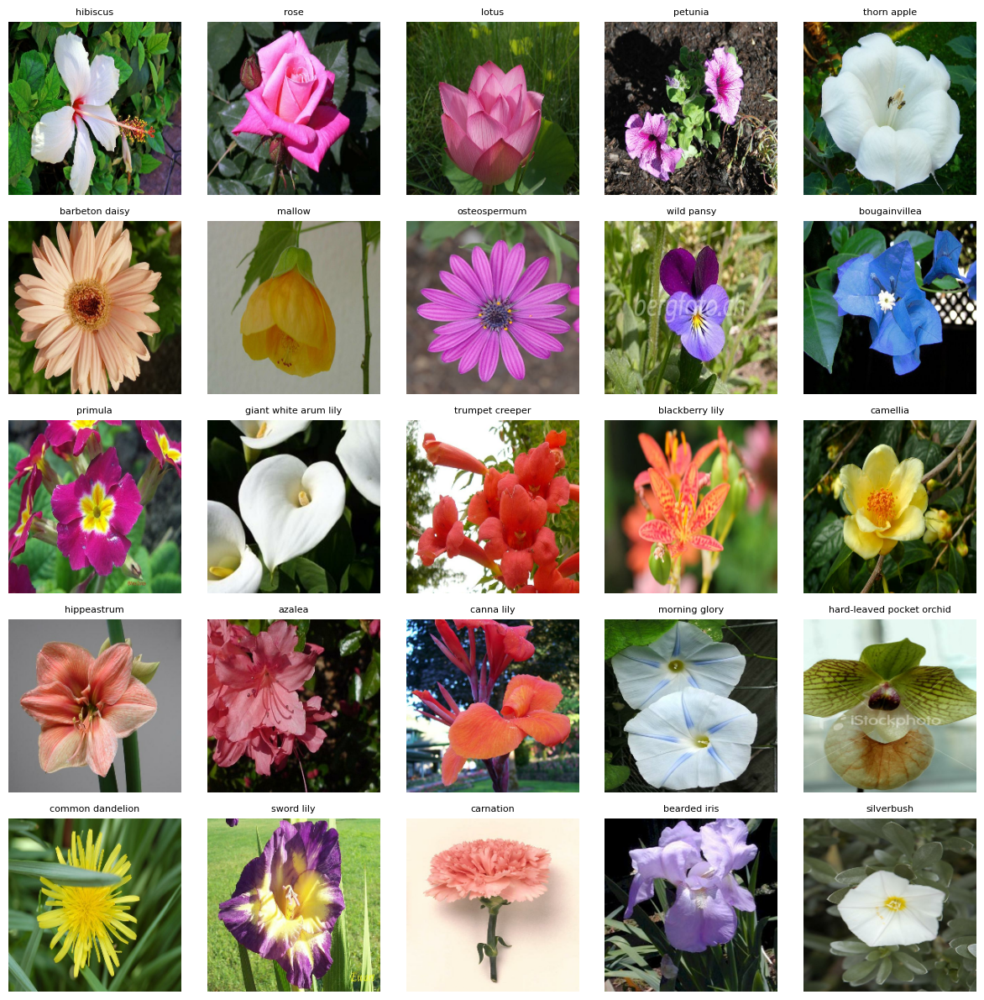

In [ ]:
group_classes(target_group=1, cluster_ids=cluster_ids, label_names=label_names, train_batches=train_batches)

Classes in Group 2:
tiger lily
moon orchid
bird of paradise
purple coneflower
pincushion flower
grape hyacinth
stemless gentian
cape flower
great masterwort
spring crocus
windflower
water lily
clematis
columbine
ball moss
bromelia


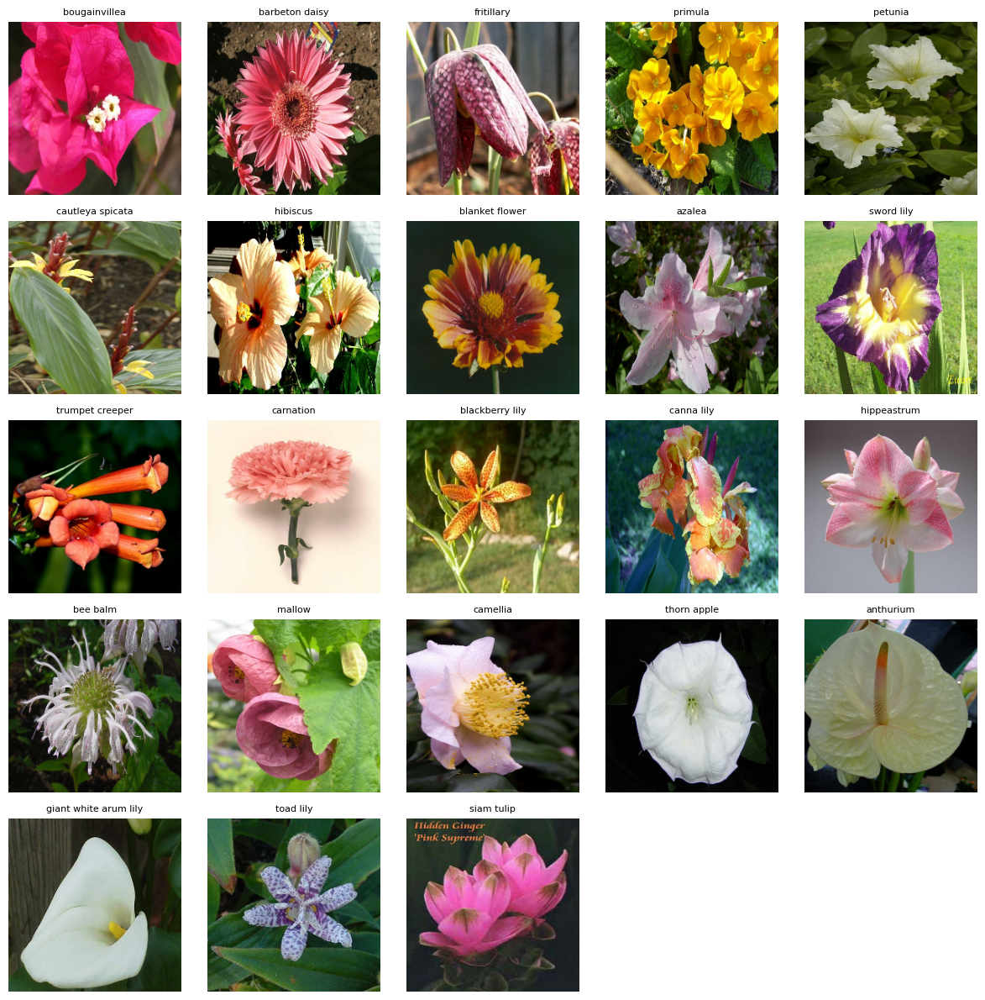

In [ ]:
group_classes(target_group=2, cluster_ids=cluster_ids, label_names=label_names, train_batches=train_batches)

#Build the Model( Hierarchical Multi-task Model)

In [ ]:
# Input essential packages
from tensorflow.keras import layers, Model
from tensorflow.keras.models import load_model

In [ ]:
# Load the pretrained NesNet 50 model, excluding the top layers
num_classes=102
image_shape=(224, 224, 3)


base_model=ResNet50(include_top=False, weights='imagenet',
                    input_shape=image_shape, pooling='avg',
                    name='resnet50')
# Freeze the base_model
for layer in base_model.layers:
    base_model.trainable=False
for layer in base_model.layers[-30:]:
    layer.trainable=True

NameError: name 'ResNet50' is not defined

In [ ]:
# Create a two Dense ouptut coarse and fine
inputs=layers.Input(shape=image_shape)
x=base_model(inputs,training=False)

# coarse head (10 clusters)
coarse_branch=layers.Dense(256, activation='relu')(x)
coarse_branch=layers.Dropout(0.5)(coarse_branch)
coarse_output=layers.Dense(10, activation='softmax', name='coarse')(coarse_branch)

# fine head(102 classes)
fine_branch=layers.Dense(512, activation='relu')(x)
fine_branch=layers.Dropout(0.5)(fine_branch)
fine_output=layers.Dense(num_classes, activation='softmax',name='fine')(fine_branch)

# Build Model
model=Model(inputs, outputs=[coarse_output, fine_output])
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 2048)      │ 23,587,712 │ input_layer_1[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 256)       │    524,544 │ resnet50[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 512)       │  1,049,088 │ resnet50[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 256)       │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 512)       │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ coarse (Dense)      │ (None, 10)        │      2,570 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ fine (Dense)        │ (None, 102)       │     52,326 │ dropout_1[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 25,216,240 (96.19 MB)

 Trainable params: 16,078,704 (61.34 MB)

 Non-trainable params: 9,137,536 (34.86 MB)

In [ ]:
# Compile with multi-task loss

losses={"coarse":tf.keras.losses.SparseCategoricalCrossentropy(),"fine":tf.keras.losses.SparseCategoricalCrossentropy()}

loss_weights={"coarse":0.2,"fine":0.8}
model.compile(optimizer=tf.keras.optimizers.Adam(1e-3), loss=losses, loss_weights=loss_weights, metrics={"coarse":"accuracy","fine": "accuracy"})

In [ ]:
import os
import tensorflow as tfflow
from keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.metrics import SparseTopKCategoricalAccuracy

In [ ]:
# set the early stopping
early_stopping = EarlyStopping(monitor='val_fine_loss', patience=3, restore_best_weights=True, mode='min')

In [ ]:
# set the 10 epoches
epoches=10
history=model.fit(train_batches, epochs=epoches, validation_data=val_batches, callbacks=[early_stopping])

Epoch 1/10
193/193 ━━━━━━━━━━━━━━━━━━━━ 96s 234ms/step - coarse_accuracy: 0.3074 - coarse_loss: 2.0121 - fine_accuracy: 0.0446 - fine_loss: 4.5571 - loss: 4.0481 - val_coarse_accuracy: 0.1725 - val_coarse_loss: 4.2097 - val_fine_accuracy: 0.0127 - val_fine_loss: 9.7938 - val_loss: 8.6786
Epoch 2/10
193/193 ━━━━━━━━━━━━━━━━━━━━ 50s 134ms/step - coarse_accuracy: 0.3816 - coarse_loss: 1.7798 - fine_accuracy: 0.0826 - fine_loss: 4.1874 - loss: 3.7059 - val_coarse_accuracy: 0.3196 - val_coarse_loss: 3.8831 - val_fine_accuracy: 0.0412 - val_fine_loss: 8.7985 - val_loss: 7.8141
Epoch 3/10
193/193 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - coarse_accuracy: 0.4066 - coarse_loss: 1.6976 - fine_accuracy: 0.1074 - fine_loss: 4.0141 - loss: 3.5508 - val_coarse_accuracy: 0.1078 - val_coarse_loss: 12.2455 - val_fine_accuracy: 0.0137 - val_fine_loss: 39.4961 - val_loss: 34.0462
Epoch 4/10
193/193 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - coarse_accuracy: 0.4267 - coarse_loss: 1.6360 - fine_accuracy: 0.1267 - f

# Results: Compare to the original model(with the hierieracl clustering)
## Gaussian blur+ Hierarchical clustering:
for training part:
coarse accuracy: 0.4344
fine accuracy:0.1412

for validation part:
coarse accuracy:0.2176
fine accuracy:0.0294
## Resize only+ Hierarchical clustering(No preprocessing)
for training part;
coarse accuracy: 0.5258
fine accuracy:0.3506

for validation part
coarse accuracy:0.3333
fine accuracy:0.1196

##Original mode (No Clustering)
for training part:

fine accuracy:0.0085

for validation part:

fine accuracy:0.0098
10× improvement with clustering
## Conclusion : Applying Gaussian blur prior to hierarchical clustering did not improve validation accuracy. In fact, it likely degraded performance by obscuring fine-grained floral features essential for classification. Preprocessing with resizing alone, combined with clustering, yielded significantly better results.


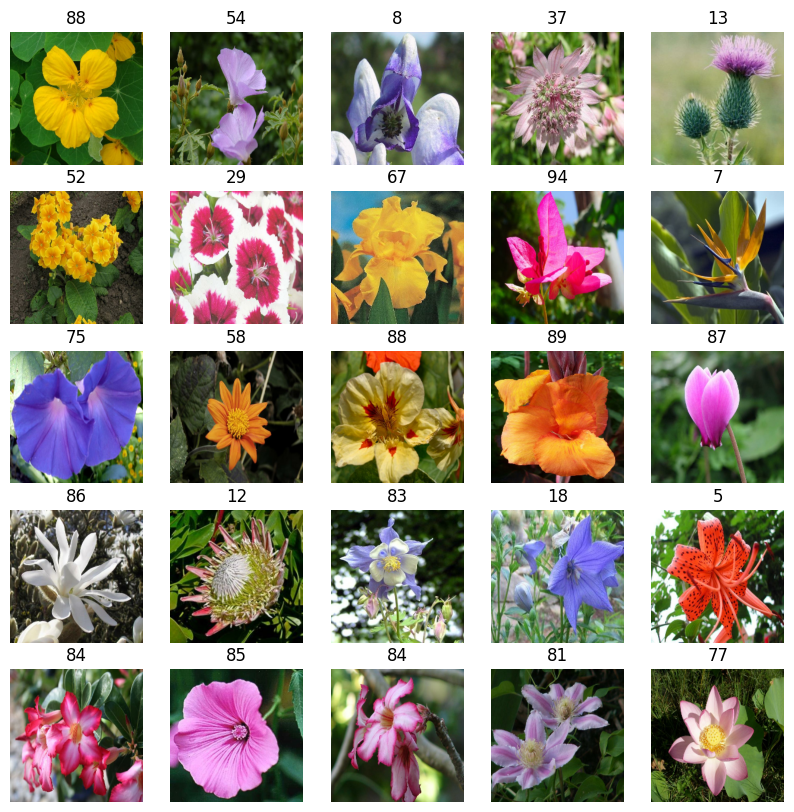

In [ ]:
# Display validation batch
for image, label in val_batches.take(1):
    plt.figure(figsize=(10,10))
    for i in range(min(25, image.shape[0])): # Adjust loop range to display up to 25 images
        ax = plt.subplot(5,5,i+1)  # Change grid size to 5x5 to accommodate more plots
        plt.imshow(image[i].numpy())
        plt.axis("off")
        plt.title(int(label['fine'][i].numpy()))
    plt.show()   # 這裡一定要 .numpy()

# Step 2: Using Pytorch and OpenCv to do segmentation and turn to Tensorflow
### the weight U2-Net is Pytorch: is used for the salient Object Detection, to find the object
(1) Download U2 Model and weight of U2-net.pth

In [ ]:
import os
import cv2
import torch
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds
from torchvision import transforms
from PIL import Image

Step 1: import U2-Net Model

In [ ]:
!pip install torch torchvision opencv-python pillow numpy


In [ ]:
!git clone https://github.com/xuebinqin/U-2-Net.git
%cd U-2-Net

fatal: destination path 'U-2-Net' already exists and is not an empty directory.
/content/U-2-Net


Step 2: Download the u2net.pth (weight of U2-Net)

In [ ]:

!curl -L https://huggingface.co/niraj128/u2net/resolve/main/u2net.pth -o u2net.pth




  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  1307  100  1307    0     0   4563      0 --:--:-- --:--:-- --:--:--  4569
100  168M  100  168M    0     0   100M      0  0:00:01  0:00:01 --:--:--  197M


In [ ]:
# Import model
from model.u2net import U2NET
import cv2
import numpy as np
import torch


In [ ]:
# define net
_net=None
def get_u2net():
    global _net
    if _net is None:
        from model import U2NET
        _net=U2NET(3,1)
        device=torch.device("cuda" if torch.cuda.is_available() else "cpu")
        _net.load_state_dict(torch.load('u2net.pth', map_location=device))
        _net.to(device)
        _net.eval()
    return _net

get_u2net() # Call the function to load the model

U2NET(
  (stage1): RSU7(
    (rebnconvin): REBNCONV(
      (conv_s1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn_s1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu_s1): ReLU(inplace=True)
    )
    (rebnconv1): REBNCONV(
      (conv_s1): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn_s1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu_s1): ReLU(inplace=True)
    )
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (rebnconv2): REBNCONV(
      (conv_s1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn_s1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu_s1): ReLU(inplace=True)
    )
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (rebnconv3): REBNCONV(
      (conv_s1): Conv2d(32, 32, k

# define the segmentation
(1) the color photo convert to object detection
color photo to binary mask the flower is 1 and backgroud is 0
(2) the size (H, W,3), pixel 0-255 to binary (H, W, 1) or (H, W. 0)


In [ ]:
# Produce the forground mask
def u2net_segment(image_np):
    #Preprocessing the data
    transform=transforms.Compose([transforms.Resize((320,320)),transforms.ToTensor(),
                                  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
    image_pil=Image.fromarray(image_np.astype(np.uint8))
    tensor=transform(image_pil).unsqueeze(0)
    tensor = tensor.to(next(_net.parameters()).device)
    # Prediction
    with torch.no_grad():
        d1, *_=_net(tensor) # Changed net to _net
        pred=d1[:, 0, :, :] # shape(1, H, W)
        pred=(pred-pred.min())/(pred.max()-pred.min())
        pred=pred.squeeze().cpu().numpy()

    # Build Mask
    mask=(pred>0.5).astype(np.uint8)
    # Morphological treatment (remove the noise, fill the holes)
    kernel = np.ones((3, 3), np.uint8) # create an kernel to operate the morphology
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel) # remove the noise
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel) # refill the holes


    return mask[...,None].astype(np.float32) # shape:(H, W,1)

# define the background



In [ ]:
def replace_background_with_gray(image_np, threshold=0.5, alpha=0.7):
    # Resize the input image to match U2-Net expect size
    image_np=cv2.resize(image_np, (320, 320))
    """
    Replace the background with gray using U²-Net segmentation,
    with post-processing (morphology, blur, blending).

    Args:
        image_np: Input RGB image (H, W, 3), dtype uint8
        threshold: Confidence threshold for mask binarization (default 0.5)
        alpha: Blending strength for gray background (0–1, default 0.7)

    Returns:
        Processed image with gray background, dtype uint8
    """
    # 1. Get U²-Net mask
    mask = u2net_segment(image_np)   # shape: (H, W, 1), float32 in [0,1]

    # 2. Apply threshold
    mask = (mask > threshold).astype(np.uint8)

    # 3. Morphological operations (remove noise & fill holes)
    kernel = np.ones((3, 3), np.uint8)


    # 4. Smooth mask edges
    mask = cv2.GaussianBlur(mask.astype(np.float32), (5, 5), 0)

    # 5. Expand mask to 3 channels
    mask_3c = np.repeat(mask[..., None], 3, axis=-1)

    # 6. Prepare background (gray)
    gray_bg = np.ones_like(image_np, dtype=np.float32) * 128

    # 7. Soft blending: flower (mask=1) + gray (mask=0)
    image_np = image_np.astype(np.float32)
    blurred_bg=cv2.GaussianBlur(gray_bg.astype(np.uint8),(5,5),0).astype(np.float32)
    image_out = image_np * mask_3c + blurred_bg * (1 - mask_3c) * alpha
    return np.clip(image_out, 0, 255).astype(np.uint8)

#Integrate with TFDS

In [ ]:
def tf_preprocess(image, label):
    # TensorFlow tensor to Numpy
    image_np=image.numpy()
    #U2-Net change to gray
    image_out=replace_background_with_gray(image_np)
    # Transofrom to Tensorflow tensor and standard
    image_out=tf.convert_to_tensor(image_out, dtype=tf.float32)
    image_out=tf.image.resize(image_out,(224,224))/255.0
    return image_out, label

# pack to tf.py_function, let TF pepeline use numpy +torch


In [ ]:
def preprocess_with_u2net(image, label):
    image, label=tf.py_function(tf_preprocess, [image,label],[tf.float32, tf.int64])
    image.set_shape((224, 224, 3))
    label.set_shape(())
    return image, label


# Build dataset pepeline


In [ ]:
train_batches=dataset['test'].map(preprocess_with_u2net,num_parallel_calls=tf.data.AUTOTUNE).batch(16).prefetch(tf.data.AUTOTUNE)

In [ ]:
val_batches=dataset['validation'].map(preprocess_with_u2net,num_parallel_calls=tf.data.AUTOTUNE).batch(16).prefetch(tf.data.AUTOTUNE)

In [ ]:
test_batches=dataset['train'].map(preprocess_with_u2net,num_parallel_calls=tf.data.AUTOTUNE).batch(16).prefetch(tf.data.AUTOTUNE)

# Visualization

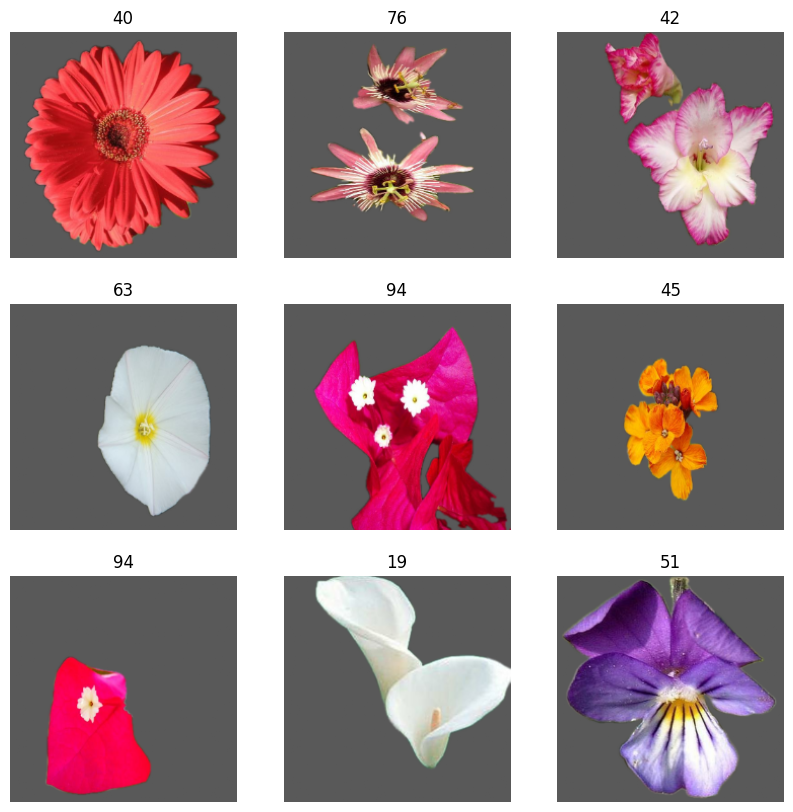

In [ ]:
for images, labels in train_batches.take(1):
    plt.figure(figsize=(10,10))
    for i in range(9):
        ax = plt.subplot(3,3,i+1)
        plt.imshow(images[i].numpy())
        plt.title(int(labels[i].numpy()))
        plt.axis("off")
    plt.show()

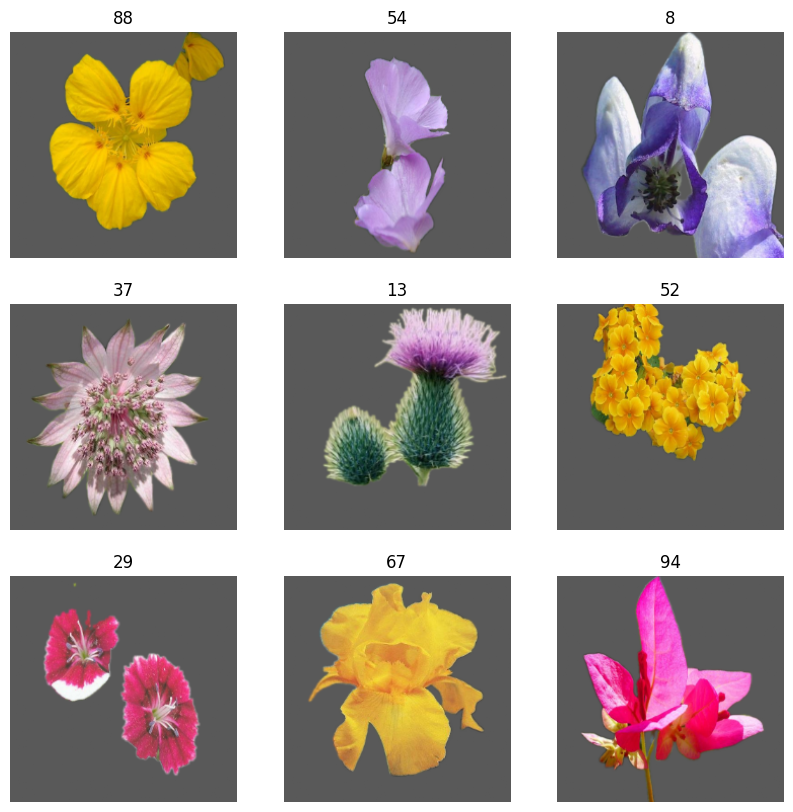

In [ ]:
for images, labels in val_batches.take(1):
    plt.figure(figsize=(10,10))
    for i in range(9):
        ax = plt.subplot(3,3,i+1)
        plt.imshow(images[i].numpy())
        plt.title(int(labels[i].numpy()))
        plt.axis("off")
    plt.show()

## Build the Original Model


3. use the pretrained model and custom head

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, Model


In [ ]:
import os
import tensorflow as tfflow
from keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.metrics import SparseTopKCategoricalAccuracy

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras import layers, models, regularizers

# Build Pretrained model

In [ ]:

# Load the pretrained NesNet 50 model, excluding the top layers
num_classes=102
image_shape=(224, 224, 3)


base_model=ResNet50(include_top=False, weights='imagenet',
                    input_shape=image_shape, classifier_activation='softmax',
                    name='resnet50')
# Freeze the base_model
base_model.trainable=False


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


# Build the custom top layers

In [ ]:
# Create a custom top layers with L2 regularization
model=models.Sequential([base_model,
            # Convert the features maps into a single vector
            layers.GlobalAveragePooling2D(),
            layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
            # Add a fully connected layer with 128 neurons and L2 regularization
            layers.Dropout(0.5),
            layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.002)), layers.BatchNormalization(),
            layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.002)),layers.BatchNormalization(),
            # Drop 50% neuron to prevent overfitting
            layers.Dropout(0.5),
            # final layer with 102 classes
            layers.Dense(num_classes, activation='softmax')
                         ])

# Compile the Model

In [ ]:
# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy']) # learning rate is 0.001

In [ ]:
# Show the summary of model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 102)            │         6,630 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,160,806 (92.17 MB)

 Trainable params: 572,710 (2.18 MB)

 Non-trainable params: 23,588,096 (89.98 MB)

# training the custom model head
set early stopping

In [ ]:
# set the early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, mode='min')

In [ ]:
for image_batch, label_batch in train_batches.take(1):
    _ = model(image_batch)  # 強制執行一次 forward pass



/content/U-2-Net/model/u2net.py:23: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  src = F.upsample(src,size=tar.shape[2:],mode='bilinear')


# Data without mean/std Normalization


In [ ]:
# set the 10 epoches
epoches=10
history=model.fit(train_batches, epochs=epoches, validation_data=val_batches, callbacks=[early_stopping])

Epoch 1/10
385/385 ━━━━━━━━━━━━━━━━━━━━ 388s 968ms/step - accuracy: 0.0117 - loss: 6.4859 - val_accuracy: 0.0118 - val_loss: 5.0983
Epoch 2/10


/usr/local/lib/python3.12/dist-packages/keras/src/callbacks/early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_fine_loss` which is not available. Available metrics are: accuracy,loss,val_accuracy,val_loss
  current = self.get_monitor_value(logs)


385/385 ━━━━━━━━━━━━━━━━━━━━ 361s 937ms/step - accuracy: 0.0183 - loss: 5.1997 - val_accuracy: 0.0098 - val_loss: 5.0102
Epoch 3/10
385/385 ━━━━━━━━━━━━━━━━━━━━ 391s 1s/step - accuracy: 0.0243 - loss: 4.9607 - val_accuracy: 0.0098 - val_loss: 4.9987
Epoch 4/10
385/385 ━━━━━━━━━━━━━━━━━━━━ 416s 948ms/step - accuracy: 0.0254 - loss: 4.8374 - val_accuracy: 0.0098 - val_loss: 4.9901
Epoch 5/10
385/385 ━━━━━━━━━━━━━━━━━━━━ 391s 1s/step - accuracy: 0.0323 - loss: 4.7393 - val_accuracy: 0.0098 - val_loss: 4.9751
Epoch 6/10
385/385 ━━━━━━━━━━━━━━━━━━━━ 412s 938ms/step - accuracy: 0.0361 - loss: 4.6832 - val_accuracy: 0.0098 - val_loss: 4.9746
Epoch 7/10
385/385 ━━━━━━━━━━━━━━━━━━━━ 393s 1s/step - accuracy: 0.0284 - loss: 4.6327 - val_accuracy: 0.0098 - val_loss: 4.9539
Epoch 8/10
 39/385 ━━━━━━━━━━━━━━━━━━━━ 4:40 812ms/step - accuracy: 0.0390 - loss: 4.5833

KeyboardInterrupt: 

## conclusion:
(1)the training accuracy  increases from 0.018 to 0.036 through 6 epoches, but the val_accurcy does not change 0.0098(it is random, and not learn by features. Therefore, we add mean/std normalization.

(2)When we do the mean/std normalization, the train accuracy increase to  and the validation accuray increase to  

# Data with Mean/std Normalization

In [ ]:
# Resize the image
image_size=224
image_mean=tf.constant([0.485, 0.456, 0.406], dtype=tf.float32)
image_std=tf.constant([0.229, 0.224, 0.225], dtype=tf.float32)

def preprocess_with_resnet50(image, label):

    # normalize with mean/std
    image=(image-image_mean)/image_std
    return image, label


In [ ]:
train_batches=dataset['test'].map(preprocess_with_u2net,num_parallel_calls=tf.data.AUTOTUNE).batch(16).map(preprocess_with_resnet50).prefetch(tf.data.AUTOTUNE)

In [ ]:
val_batches=dataset['validation'].map(preprocess_with_u2net,num_parallel_calls=tf.data.AUTOTUNE).batch(16).map(preprocess_with_resnet50).map(preprocess_with_resnet50).prefetch(tf.data.AUTOTUNE)

In [ ]:
test_batches=dataset['train'].map(preprocess_with_u2net,num_parallel_calls=tf.data.AUTOTUNE).batch(16).map(preprocess_with_resnet50).prefetch(tf.data.AUTOTUNE)

In [ ]:
# Load the pretrained NesNet 50 model, excluding the top layers
num_classes=102
image_shape=(224, 224, 3)


base_model=ResNet50(include_top=False, weights='imagenet',
                    input_shape=image_shape, classifier_activation='softmax',
                    name='resnet50')
# Freeze the base_model
base_model.trainable=False

In [ ]:
# Create a custom top layers with L2 regularization
model=models.Sequential([base_model,
            # Convert the features maps into a single vector
            layers.GlobalAveragePooling2D(),
            layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
            # Add a fully connected layer with 128 neurons and L2 regularization
            layers.Dropout(0.5),
            layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.002)), layers.BatchNormalization(),
            layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.002)),layers.BatchNormalization(),
            # Drop 50% neuron to prevent overfitting
            layers.Dropout(0.5),
            # final layer with 102 classes
            layers.Dense(num_classes, activation='softmax')
                         ])

In [ ]:
# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy']) # learning rate is 0.001

In [ ]:
# set the early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, mode='min')

In [ ]:
# set the 10 epoches
epoches=10
history=model.fit(train_batches, epochs=epoches, validation_data=val_batches, callbacks=[early_stopping])

Epoch 1/10


/content/U-2-Net/model/u2net.py:23: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  src = F.upsample(src,size=tar.shape[2:],mode='bilinear')


385/385 ━━━━━━━━━━━━━━━━━━━━ 403s 1s/step - accuracy: 0.0134 - loss: 7.0464 - val_accuracy: 0.0098 - val_loss: 6.2563
Epoch 2/10
385/385 ━━━━━━━━━━━━━━━━━━━━ 365s 947ms/step - accuracy: 0.0486 - loss: 5.0880 - val_accuracy: 0.0324 - val_loss: 5.2203
Epoch 3/10
385/385 ━━━━━━━━━━━━━━━━━━━━ 395s 1s/step - accuracy: 0.0787 - loss: 4.6583 - val_accuracy: 0.0235 - val_loss: 5.2060
Epoch 4/10
385/385 ━━━━━━━━━━━━━━━━━━━━ 442s 1s/step - accuracy: 0.1102 - loss: 4.4023 - val_accuracy: 0.0147 - val_loss: 6.1373
Epoch 5/10
385/385 ━━━━━━━━━━━━━━━━━━━━ 411s 944ms/step - accuracy: 0.1136 - loss: 4.2864 - val_accuracy: 0.0343 - val_loss: 5.2927
Epoch 6/10
385/385 ━━━━━━━━━━━━━━━━━━━━ 403s 1s/step - accuracy: 0.1328 - loss: 4.1241 - val_accuracy: 0.0343 - val_loss: 5.0011
Epoch 7/10
385/385 ━━━━━━━━━━━━━━━━━━━━ 403s 946ms/step - accuracy: 0.1329 - loss: 4.0612 - val_accuracy: 0.0539 - val_loss: 5.0548
Epoch 8/10
385/385 ━━━━━━━━━━━━━━━━━━━━ 363s 943ms/step - accuracy: 0.1439 - loss: 3.9750 - val_acc

#(2) Using Pytorch and OpenCv to do segmentation and turn to Tensorflow (apply U2-Net)
- U²-Net with mean/std normalization improves fine-grained classification performance compared to the original model, despite not using clustering.
- Training fine accuracy reaches 0.1576, and validation fine accuracy improves to 0.0873, indicating that statistical normalization helps the model better generalize to unseen data.
- While not outperforming clustering-based methods, this preprocessing strategy enhances feature consistency, likely aiding segmentation and classification of subtle floral patterns.
- The results suggest that U²-Net’s segmentation capabilities combined with normalization offer a meaningful boost, especially when clustering is not applied.